In [41]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms, models
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix
import seaborn as sns


### Loading image patches

In [42]:
class ImagePatchDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.class_names = sorted(os.listdir(image_dir))
        self.image_paths = []
        self.labels = []

        for class_name in self.class_names:
            class_dir = os.path.join(image_dir, class_name)
            for image_name in os.listdir(class_dir):
                self.image_paths.append(os.path.join(class_dir, image_name))
                self.labels.append(self.class_names.index(class_name))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert('RGB')  # Ensure 3 channels
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label
# Resize images to a fixed size and normalize them:
transform_1 = transforms.Compose([
    transforms.Resize((64, 64)),  # Resize all patches to 64x64
    transforms.ToTensor(),        # Convert to tensor and normalize to [0, 1]
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet stats
])
# Data augmentation to increase training set size
transform_2 = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(30),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
    transforms.Resize((64, 64)),  # Resize all patches to 64x64
    transforms.ToTensor(),        # Convert to tensor and normalize to [0, 1]
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet stats
])


image_dir = './Training_patches'  # Load training patches
dataset = ImagePatchDataset(image_dir, transform=transform_1) + ImagePatchDataset(image_dir, transform=transform_2) + \
    ImagePatchDataset(image_dir, transform=transform_2) + ImagePatchDataset(image_dir, transform=transform_2)+\
    ImagePatchDataset(image_dir, transform=transform_2) + ImagePatchDataset(image_dir, transform=transform_2)
len(dataset)

9522

In [43]:
# Split data into training and test set
# Split dataset into train (85%), and test (15%)
train_size = int(0.85 * len(dataset))
test_size = len(dataset) - train_size 

train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [44]:
# Define the CNN Model
class CNN(nn.Module):
    def __init__(self, num_classes):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.fc1 = nn.Linear(64 * 16 * 16, 128)  # Adjust based on input size
        self.fc2 = nn.Linear(128, num_classes)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.pool(nn.functional.relu(self.conv1(x)))
        x = self.pool(nn.functional.relu(self.conv2(x)))
        x = x.view(-1, 64 * 16 * 16)  # Flatten
        x = nn.functional.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

num_classes = len(ImagePatchDataset(image_dir, transform=transform_1).class_names)
model = CNN(num_classes)


# Using a pre-trained ResNet18 model
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 10)  # Assuming 10 classes

# Move model to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss()
# optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0001, weight_decay=0.01)
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=25):
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
        
        epoch_loss = running_loss / len(train_loader.dataset)
        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}')
        
        # Validation phase
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
        
        val_loss = val_loss / len(val_loader.dataset)
        val_acc = correct / total
        print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}')

# # Train the model
# train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=25)

# Define K-Fold Cross-Validation
kf = KFold(n_splits=5, shuffle=True)

for fold, (train_idx, val_idx) in enumerate(kf.split(train_dataset)):
    print(f'Fold {fold+1}')
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_idx)
    val_subsampler = torch.utils.data.SubsetRandomSampler(val_idx)
    
    train_loader = DataLoader(dataset, batch_size=32, sampler=train_subsampler)
    val_loader = DataLoader(dataset, batch_size=32, sampler=val_subsampler)
    
    # Reinitialize the model for each fold
    model = models.resnet18(pretrained=True)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, 10)
    model = model.to(device)
    
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.0001, weight_decay=0.01) # using AdamW or SGD?
    
    train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10)

/home/xli/miniconda3/envs/kaggle/lib/python3.13/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/xli/miniconda3/envs/kaggle/lib/python3.13/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Fold 1
Epoch 1/10, Loss: 0.2006
Validation Loss: 0.0138, Validation Accuracy: 0.9704
Epoch 2/10, Loss: 0.0556
Validation Loss: 0.0124, Validation Accuracy: 0.9759
Epoch 3/10, Loss: 0.0406
Validation Loss: 0.0089, Validation Accuracy: 0.9796
Epoch 4/10, Loss: 0.0353
Validation Loss: 0.0081, Validation Accuracy: 0.9833
Epoch 5/10, Loss: 0.0283
Validation Loss: 0.0071, Validation Accuracy: 0.9870
Epoch 6/10, Loss: 0.0263
Validation Loss: 0.0061, Validation Accuracy: 0.9883
Epoch 7/10, Loss: 0.0273
Validation Loss: 0.0064, Validation Accuracy: 0.9870
Epoch 8/10, Loss: 0.0231
Validation Loss: 0.0062, Validation Accuracy: 0.9864
Epoch 9/10, Loss: 0.0250
Validation Loss: 0.0056, Validation Accuracy: 0.9889
Epoch 10/10, Loss: 0.0176
Validation Loss: 0.0047, Validation Accuracy: 0.9901
Fold 2
Epoch 1/10, Loss: 0.2093
Validation Loss: 0.0244, Validation Accuracy: 0.9531
Epoch 2/10, Loss: 0.0568
Validation Loss: 0.0132, Validation Accuracy: 0.9790
Epoch 3/10, Loss: 0.0390
Validation Loss: 0.0093,

In [45]:
# Test the model
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Test Accuracy: {100 * correct / total:.2f}%')

Test Accuracy: 98.88%


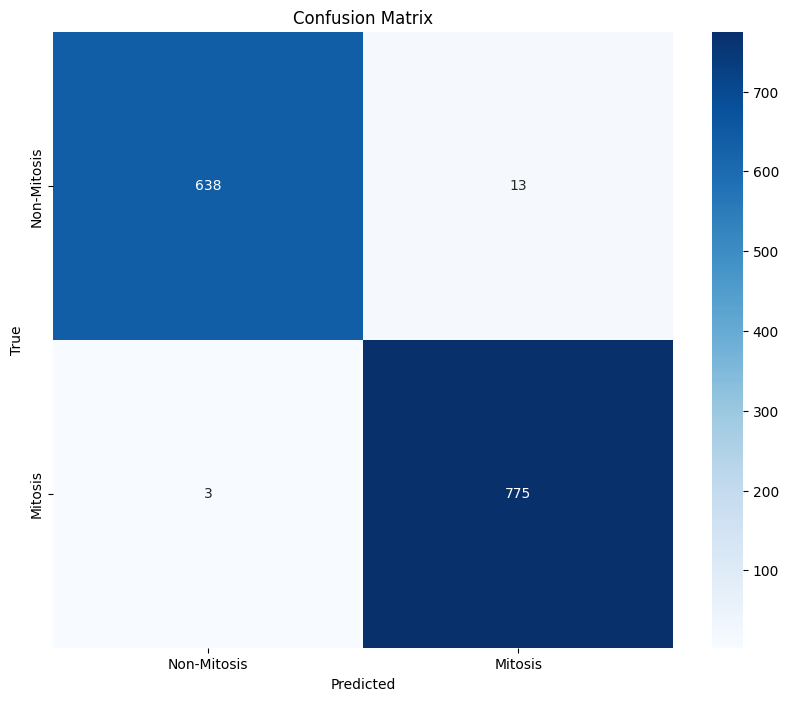

In [47]:
# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

# Get predictions on the Test set
model.eval()
all_preds = []
all_labels = []
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Plot confusion matrix
class_names = ['Non-Mitosis', 'Mitosis']  # Replace with your class names
plot_confusion_matrix(all_labels, all_preds, class_names)

In [49]:
# Load final test data
class ImagePatchDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.class_names = sorted(os.listdir(image_dir))
        self.image_paths = []
        self.labels = []

        for class_name in self.class_names:
            class_dir = os.path.join(image_dir, class_name)
            for image_name in os.listdir(class_dir):
                self.image_paths.append(os.path.join(class_dir, image_name))
                self.labels.append(image_name)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert('RGB')  # Ensure 3 channels
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label
# Resize images to a fixed size and normalize them:
transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Resize all patches to 64x64
    transforms.ToTensor(),        # Convert to tensor and normalize to [0, 1]
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet stats
])

image_dir = 'Testing_patches'  # Replace with your dataset path
real_dataset = ImagePatchDataset(image_dir, transform=transform)
# real_dataset[0]

In [50]:
# Perform prediction for real dataset
model.eval()
Predicted_label = []
with torch.no_grad():
    for images, _ in real_dataset:
        images, _ = images.to(device), labels.to(device)
        outputs = model(images.unsqueeze(0))
        _, predicted = torch.max(outputs.data, 1)
        Predicted_label.append(int(predicted))
        # total += labels.size(0)
        # correct += (predicted == labels).sum().item()
final_result = {real_dataset[i][1]:Predicted_label[i] for i in range(len(Predicted_label))}

In [51]:
# Add the prediction to the submission_template
import pandas as pd
submission = pd.read_csv('./Data_122824/Submission_template.csv')
# label_dict = {1: 0, 0: 1}
Prediction = []
for i in range(len(submission)):
    patch_ind = int(submission['Label ID'][i].split('Blank')[-1]) - 1
    key = '{}_patch{}.png'.format(submission['Image ID'][i], patch_ind)
    Prediction.append(final_result[key])
submission['Prediction'] = Prediction
submission.to_csv('Sumission_resnet18_4.csv')

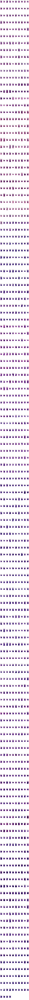

In [52]:
# verify all the patches, seems like test13 and test15 have some issues with the polygon
def visualize_images_in_folder(folder_path, images_per_row=5, figsize=(12, 400)):
    """
    Visualize all images in a folder in a grid layout.

    Args:
        folder_path (str): Path to the folder containing images.
        images_per_row (int): Number of images to display per row.
        figsize (tuple): Size of the matplotlib figure.
    """
    # Get a list of all image files in the folder
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]
    image_files = sorted(image_files)
    num_images = len(image_files)

    if num_images == 0:
        print("No images found in the folder.")
        return

    # Calculate the number of rows needed
    num_rows = (num_images + images_per_row - 1) // images_per_row

    # Create a matplotlib figure
    fig, axes = plt.subplots(num_rows, images_per_row, figsize=figsize)
    fig.tight_layout()

    # If there's only one row, axes will be 1D
    if num_rows == 1:
        axes = axes.reshape(1, -1)

    # Iterate through the images and display them
    for idx, image_file in enumerate(image_files):
        row = idx // images_per_row
        col = idx % images_per_row

        # Open the image using PIL
        image_path = os.path.join(folder_path, image_file)
        try:
            img = Image.open(image_path)
            axes[row, col].imshow(img)
            axes[row, col].set_title('Predict: {}'.format(final_result[image_file]), fontsize='large')
            axes[row, col].axis('off')  # Hide axes
        except Exception as e:
            print(f"Error loading image {image_file}: {e}")
            axes[row, col].axis('off')  # Hide axes if image fails to load

    # Hide empty subplots
    for idx in range(num_images, num_rows * images_per_row):
        row = idx // images_per_row
        col = idx % images_per_row
        axes[row, col].axis('off')

    plt.show()

# Example usage
folder_path = "Data_122824/Glioma_MDC_2025_test/Patchs/"  # Replace with your folder path
visualize_images_in_folder(folder_path, images_per_row=10)